# Image Denoising
    
*   Mykola Liashuha
*   Jose Gonzalez Lopez

# Introduction
In this notebook, we will do an image denoising procedure by simulating an impainting problem. We will generate the direct problem and then we will estimate the original image using two different sparse approaches (wavelet orhtogonal transform and translation invariant wavelets) and three thresholding rules (soft, hard and wiener). This methodology has many parameters that have to be discussed and studied to see their effects in each iteration of the algorithms. Last but not least, we have based this exercise on [1].

# Imports

In [1]:
import scipy #Library for signal analysis
import matplotlib.pyplot as plt #Plot
import numpy as np #Operations
import cv2 #Read images and do operations
import IPython.display as ipd
import numpy.random #For generating noise

from numpy import linalg

from scipy.io import wavfile #Read wavfiles
from scipy.signal import welch,stft,istft #Get power density estimated, short fourier transform

#Numerical tools imports
from __future__ import division
from nt_toolbox.general import *
from nt_toolbox.signal import *
from nt_toolbox.perform_wavelet_transf import *
%load_ext autoreload
%autoreload 2
%pylab inline
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


/usr/lib/python3/dist-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['pylab']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


# Auxiliar Functions

In [2]:
'''
Return the masked image with a mask omega 
'''
def Phi(f,omega):
    return f*(1-omega)

In [3]:
'''
Return the Soft Thresholding operator
'''
def SoftThresh(x, T): 
    return x*np.maximum(1-T/np.maximum(abs(x), 1e-10*np.ones(np.shape(x))), np.zeros(np.shape(x)))

In [4]:
'''
Apply hard Thresholding operator
'''
def HardThresh(x, T):
    return x*(abs(x) > T)

In [5]:
'''
Apply Empirical Wiener operator
'''
def WienerOP(x, T):
    return x*np.maximum(1-T**2/np.maximum(abs(x)**2, 1e-10*np.ones(np.shape(x))), np.zeros(np.shape(x)))

In [6]:
'''
From wavelet domain to real domain
'''
def Psi(a,Jmin):
    return perform_wavelet_transf(a, Jmin, -1, ti=0)

In [7]:
'''
From real domain to wavelet domain
'''
def PsiS(f,Jmin): 
    return perform_wavelet_transf(f, Jmin, +1, ti=0)

In [8]:
'''
Apply Soft Thresholding while round trip to wavelet domain
'''
def SoftThreshPsi(f, T, Jmin):
    return Psi(SoftThresh(PsiS(f,Jmin), T),Jmin)

In [9]:
'''
Apply Hard Thresholding while round trip to wavelet domain
'''
def HardThreshPsi(f, T, Jmin):
    return Psi(HardThresh(PsiS(f,Jmin), T),Jmin)

In [10]:
'''
Apply Wiener Thresholding while round trip to wavelet domain
'''
def WienerOPPsi(f, T, Jmin):
    return Psi(WienerOP(PsiS(f,Jmin), T),Jmin)

In [11]:
'''
Projection operation for orthogonal
'''
def ProjC(f, omega,y): 
    return omega*f + (1-omega)*y

In [12]:
'''
Projection operation for invariant
'''
def Xi(a,Jmin): 
    return perform_wavelet_transf(a, Jmin, -1, ti=1)

In [13]:
'''
From real domain to wavelet domain
'''
def PsiS_a(f,Jmin): 
    return perform_wavelet_transf(f, Jmin, + 1, ti=1)

In [14]:
'''
Scaling factor
'''
def Psi_a(a,U,Jmin): 
    return Xi(a/U,Jmin)

In [15]:
'''
Calculate the snr value between two signals
'''
def snr (u, v):
    snr_val = 20*np.log10(np.linalg.norm(u)/np.linalg.norm(u-v))
    return snr_val

# Loading Data
Below we load the image, normalize it to set values between [0,1] and get gray image.

In [16]:
img = cv2.imread('barbara.jpg') #Image
gray = np.array(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)) #Covert to one channel, black and white
gray = gray / 255. #Normalize

height,width = gray.shape


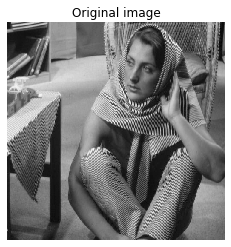

In [17]:
imageplot(gray, 'Original image')

# Direct inpaiting problem generator
We are going to create the observed image ($y$) by first making the binary mask ($\omega$), apply it to the image ($x$) with the ($\phi$) masking operation and then sum some white noise ($w$).

\begin{equation}
y=\phi(x,\omega) + w.
\end{equation}

We will create different white noises and masks with diverse stds and probabilities respectively to see the effects of the operations. As we are having an impating problem, the objective is to create holes in the image and fill them. Our masking operation will be:

\begin{equation}
\phi(x,\omega) = x \cdot (1-\omega)
\end{equation}

In [18]:
observed_images=[] #We are going to store the observed images here
omegas=[] #We are going to store here the binary masks
stds = [0.16, 0.08, 0.04] #White noises
probabilities=np.arange(0.2,1,0.2)
for p in probabilities:
    omega=np.random.binomial(1,p,(height,width)) #Creation of mask
    masked=Phi(gray,omega) #Apply to gray image
    for std in stds:
        noise = np.random.normal(0, 1, size=gray.shape) #Creation of white noise
        obs_img = masked + std*noise #Observed image
        omegas.append(omega) #Keep the mask (for later computations)
        observed_images.append((obs_img,p,std)) #Keep the observed image


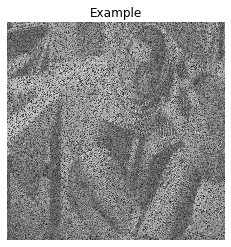

In [19]:
imageplot(observed_images[0][0], 'Example')

# What is sparse regularization? 
After consider creating the observed image ($y$), we will focus on using sparsity to recover an image from the measurements. Sparse regularization considers a synthesis-based regularization, that computes a sparse set of coefficients $(a^{*}_{m})_{m}$ in a frame $Ψ=(ψ_{m})_{m}$ that solves this minimization problem. 

\begin{equation}
a^{⋆} \in argmin_{a}\cfrac{1}{2}∥y−ΦΨa∥_{2}+λJ(a).
\end{equation}

where λ should be adapted to the noise level ∥w∥ and $Ψ$ is the wavelet transformation.

Here we use the notation 

\begin{equation}
Ψa=∑_{m}a_{m}ψ_{m}.
\end{equation}

to indicate the reconstruction operator, and J(a) is the ℓ1 sparsity prior 

\begin{equation}
J(a)=∑_{m}∥a_{m}∥.
\end{equation}

# Inpainting using Orthogonal Wavelet Sparsity
Having [1] as the main reference for this exercise, if $Ψ$ is an orthogonal basis, a change of variable shows that the synthesis prior is also an analysis prior, that reads 

\begin{equation}
f^{⋆} \in argmin_{f}\phantom{a}E(f)=\cfrac{1}{2}∥y−Φf∥^{2}+λ∑_{m}∥⟨f,ψ_{m}⟩∥.
\end{equation}

To solve this non-smooth optimization problem, one can use forward-backward splitting. It computes a series of images $f^{(ℓ)}$ defined as 

\begin{equation}
f^{(ℓ+1)}=O^{Ψ}_{τλ}(f^{(ℓ)}−τΦ^{∗}(Φf^{(ℓ)}−y))
\end{equation}

where $O$ is a threshold operation, dependent on the wavelet transform $Ψ$. $Φ$ is the masking operator, $Φ^{*}$ is the inverse operation of the masking operation and $y$ is the observed image. $τ$ and $λ$ are arbitraty parameters.

Important things to consider:

* In our setting, we have $Φ^{∗}=Φ$ (the inverse operation is the same as the forward operation) which is an operator of norm 1. We believe that this holds because the masking operation is a orthogonal projection (as we are doing orthogonal wavelet sparsity). 
* Orthongonal projections have this property $ΦΦx=Φx$ (applying twice the operation is the same as applying it once).
* For $f^{(ℓ)}$ to converge to a solution of the problem, the gradient step size should be chosen as
    \begin{equation}
    τ<\cfrac{2}{∥Φ∗Φ∥}=2
    \end{equation}
    we do not know why this holds and we will using $τ=1$ in this exercise.

Now, the procedure has two steps: the gradient descent step and the application of the thresholding operation each iteration (until convergence). The gradient descent step can be seen as another projection on the inpainting constraint

\begin{equation}
C=\{f\setminus ∀Ω(x)=0,f(x)=y(x)\}
\end{equation}

And thus we have

\begin{equation}
f−τΦ^{∗}(Φf−y)=\text{Proj}_{C}(f)
\end{equation}

And simplifying the left hand side we have

\begin{equation}
f - Φf + Φy = f-f * (1-\omega) + y * (1-\omega) = \omega f + y * (1-\omega)
\end{equation}

Now what is left is to apply each threshold operation in each case and discuss the results. Each iteration of the forward-backward (iterative thresholding) algorithm thus reads:

\begin{equation}
f^{(ℓ+1)}=O^{Ψ}_{λ}(\text{Proj}_{C}(f^{(ℓ)})).
\end{equation}

## Soft Thresholding
First we will plot the 1D curve

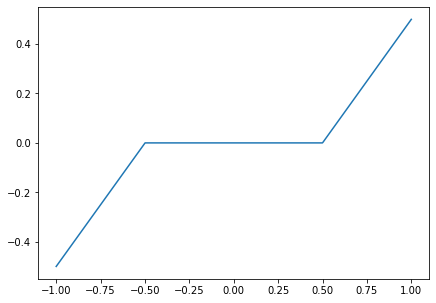

In [95]:
x = np.linspace(-1, 1, 1000)

plt.figure(figsize=(7,5))
plt.plot(x, SoftThresh(x,.5))
plt.show()

And now we will prepare the parameters of the thresholding and the reconstruction operator before applying the algorithm.

In [96]:
lambdas=np.arange(0.1,1,0.1)

In [97]:
Jmax = np.log2(height)-1
Jmin = Jmax-3

The algorithm is programed here below. We will move the gradient descent (Proj$_{C}$) to the wavelet domain and return back to the real domain to get the image in each iteration. We will do 100 iterations. We will be ploting the best reconstruction in each case and record the best parameters used in the process

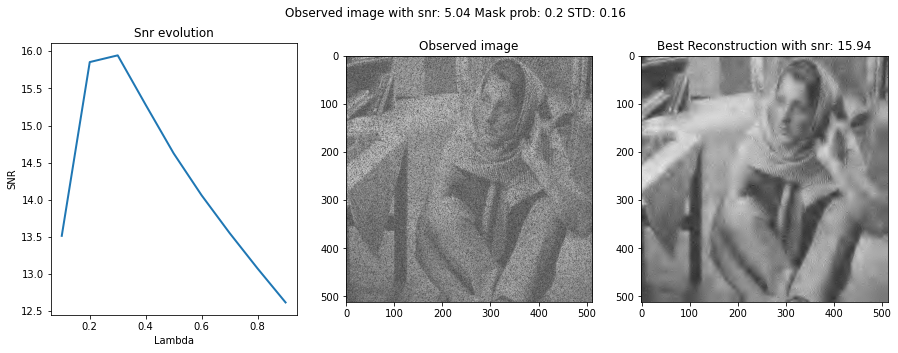

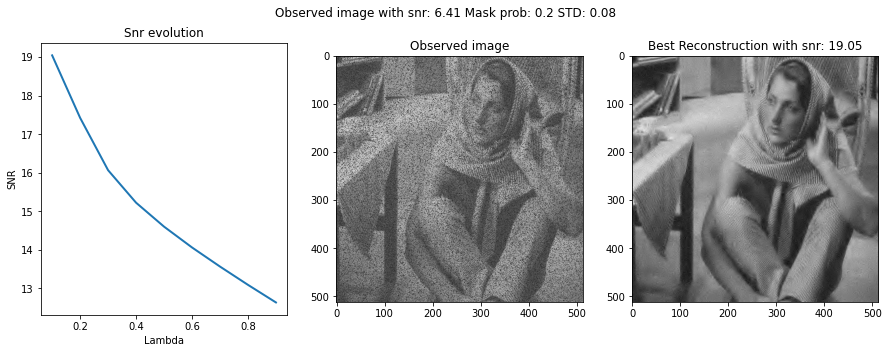

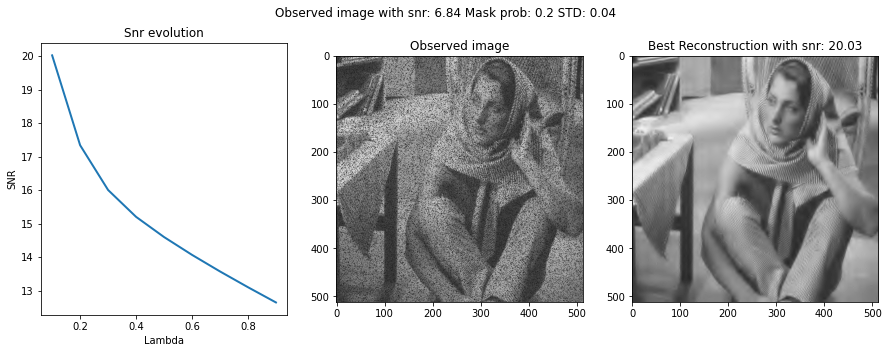

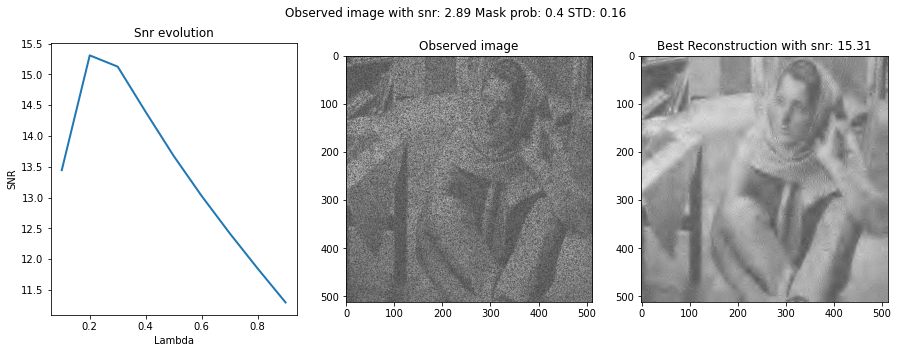

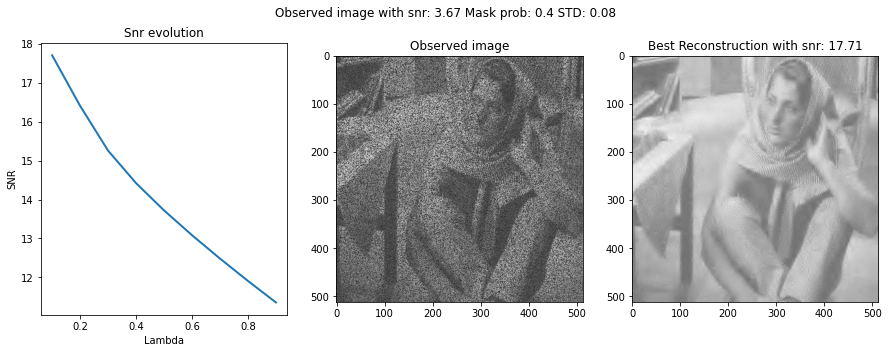

...

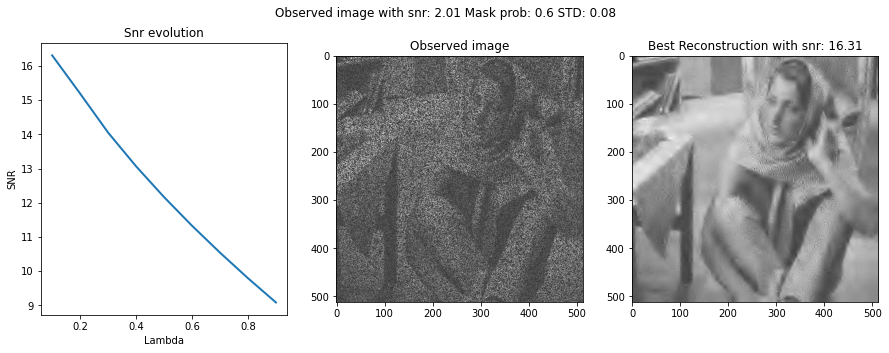

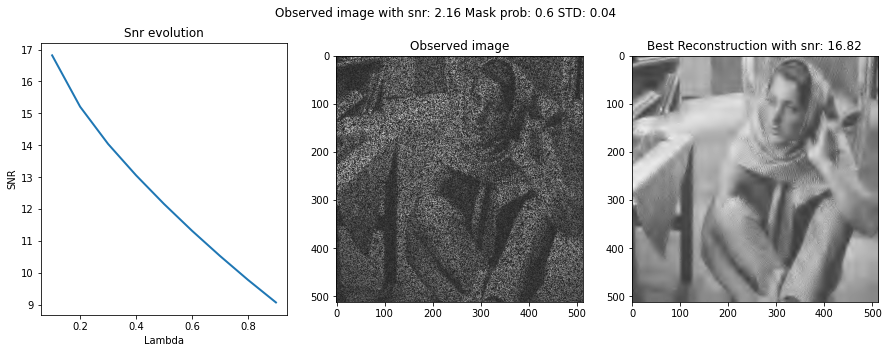

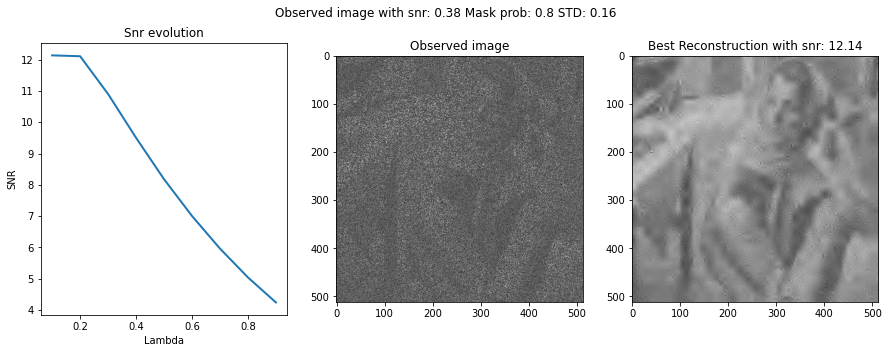

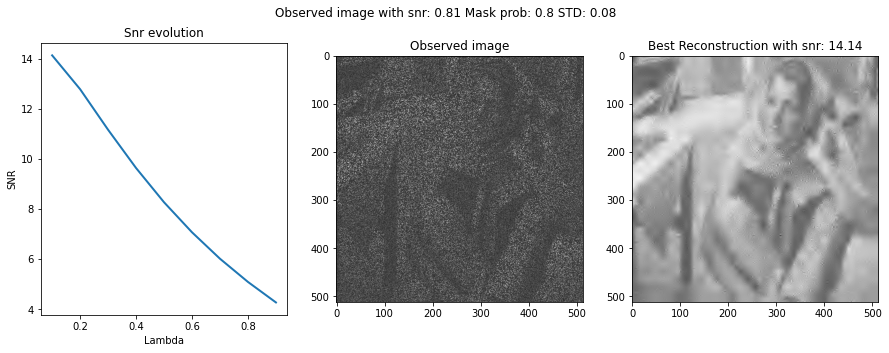

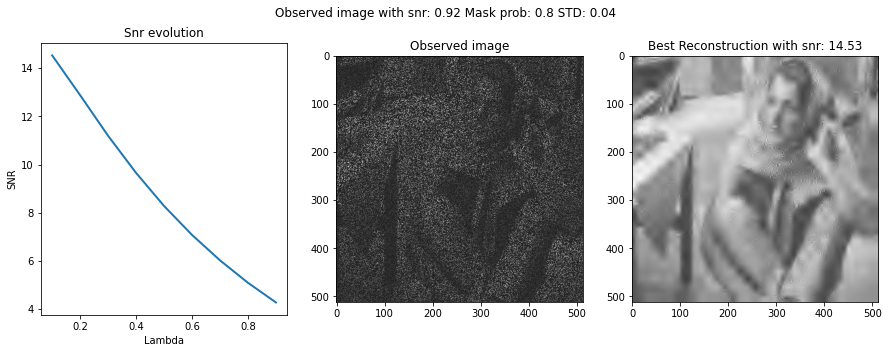

In [100]:
for i in range(len(observed_images)):
    y=observed_images[i][0] #Get observed image
    fSpars=observed_images[i][0] #First iteration, observed image
    prob=observed_images[i][1]
    standard_d = observed_images[i][2]
    omega=omegas[i] #The mask applied to that image
    
    lambda_list=[]
    snr_s=[]
    best_image=None
    best_snr = -np.inf
    
    for lambd in lambdas: #For each lambda
        lambda_list.append(lambd) #Store lambda
        niter = 100
        for j in range(niter): #Repeat n times
            fSpars = SoftThreshPsi(ProjC(fSpars, omega, y), lambd,Jmin) #Ψ * Proj * Ψ
        
        snr_image=snr(gray,fSpars)
        if(snr_image>best_snr):
            best_snr=snr_image
            best_image=fSpars
        snr_s.append(snr_image)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle("Observed image with snr: " + str(round(snr(gray,y),2)) + " Mask prob: " + str(round(prob,2)) + " STD: " + str(round(standard_d,2)))
    
    ax1.set_title("Snr evolution")
    ax1.plot(lambda_list, snr_s, linewidth=2)
    ax1.set_xlabel("Lambda")
    ax1.set_ylabel("SNR")
    
    ax2.set_title("Observed image")
    ax2.imshow(y,cmap='gray')
    
    ax3.set_title("Best Reconstruction with snr: " + str(round(best_snr,2)))
    ax3.imshow(best_image,cmap='gray')
    
    fig.set_figheight(5)
    fig.set_figwidth(15)
    
    plt.show()

## Hard Thresholding
First we will plot the 1D curve

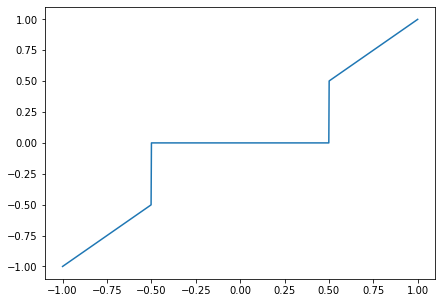

In [101]:
x = np.linspace(-1, 1, 1000)

plt.figure(figsize=(7,5))
plt.plot(x, HardThresh(x,.5))
plt.show()

And now we will prepare the parameters of the thresholding and the reconstruction operator before applying the algorithm.

In [102]:
lambdas=np.arange(0.1,1,0.1)

In [103]:
Jmax = np.log2(height)-1
Jmin = Jmax-3

The algorithm is programed here below. We will move the gradient descent (Proj$_{C}$) to the wavelet domain and return back to the real domain to get the image in each iteration. We will do 100 iterations. We will be ploting the best reconstruction in each case and record the best parameters used in the process

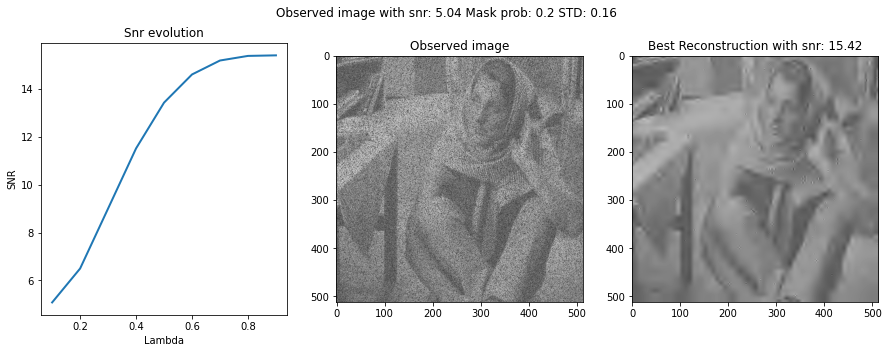

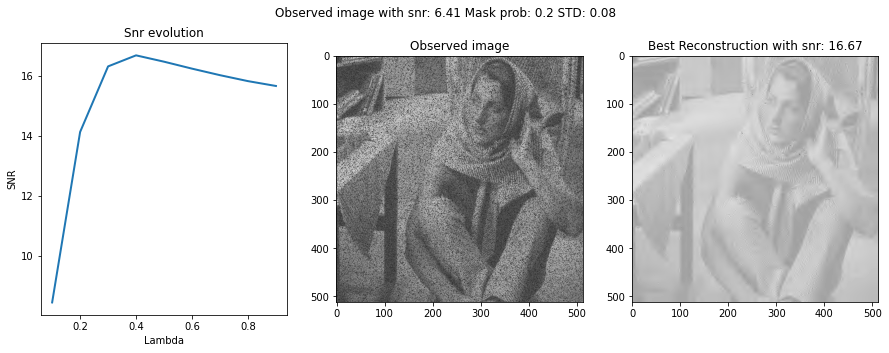

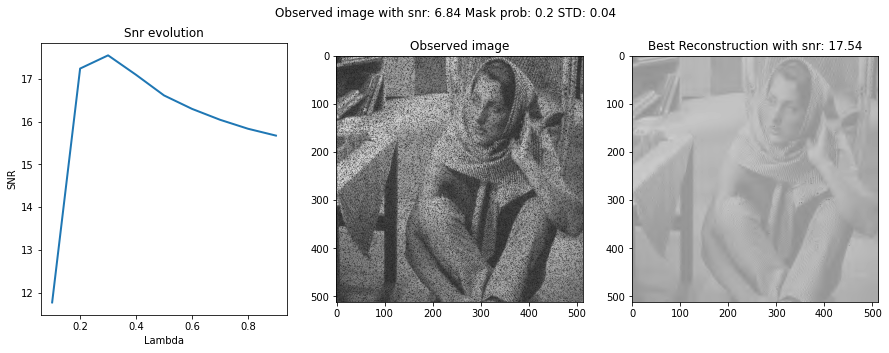

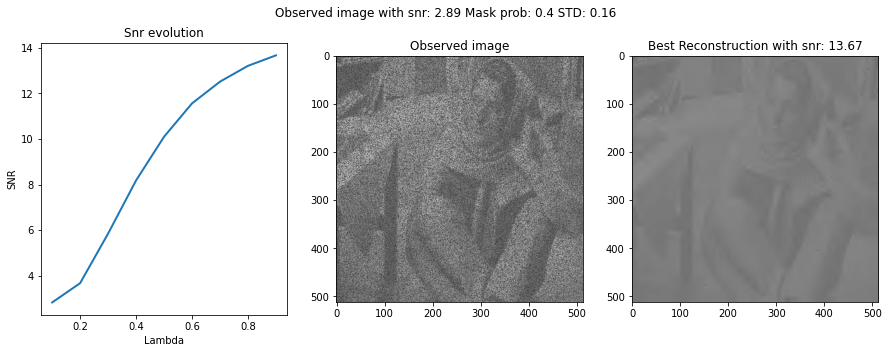

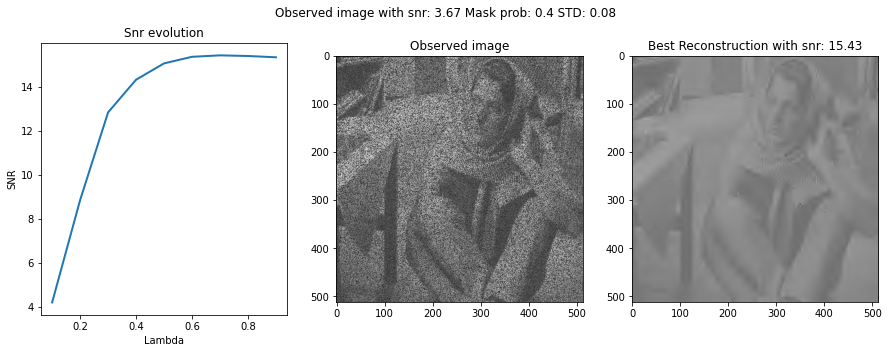

...

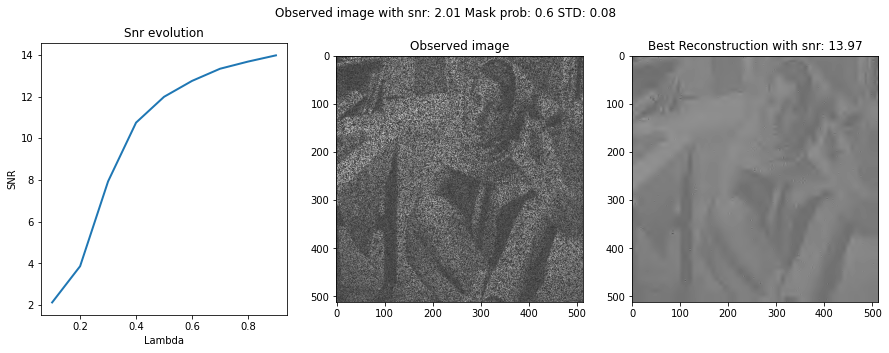

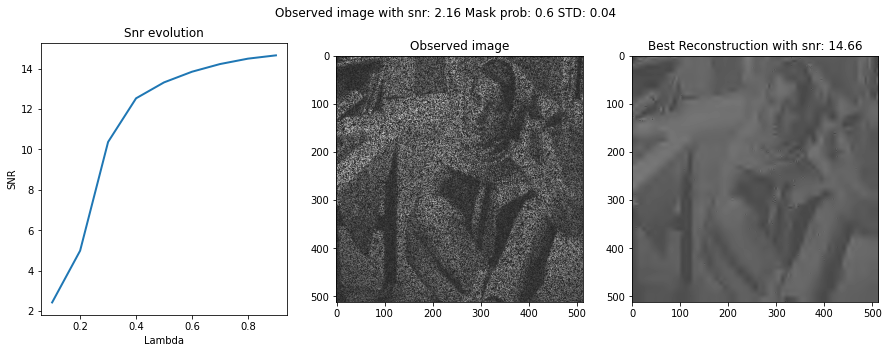

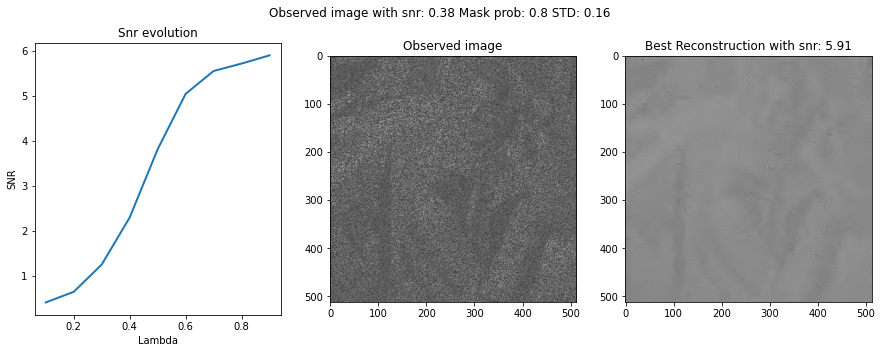

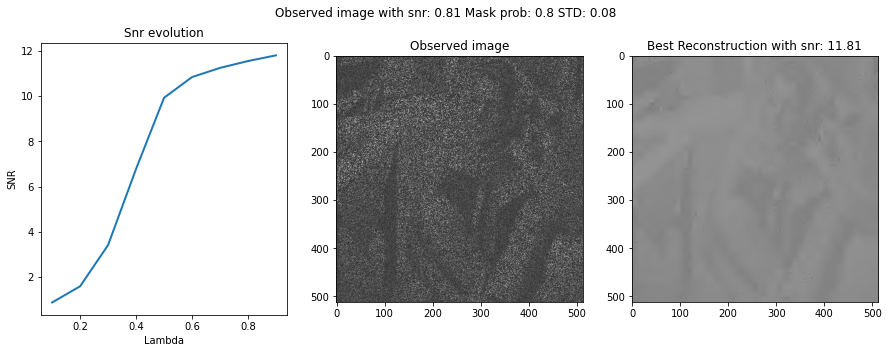

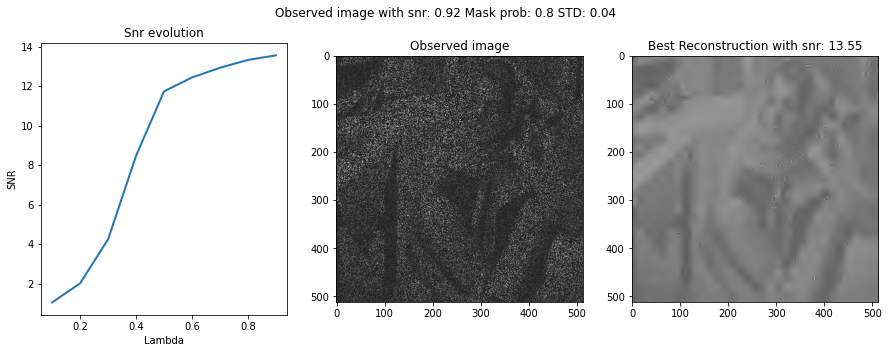

In [104]:
for i in range(len(observed_images)):
    y=observed_images[i][0] #Get observed image
    fSpars=observed_images[i][0] #First iteration, observed image
    prob=observed_images[i][1]
    standard_d = observed_images[i][2]
    omega=omegas[i] #The mask applied to that image
    
    lambda_list=[]
    snr_s=[]
    best_image=None
    best_snr = -np.inf
    
    for lambd in lambdas: #For each lambda
        lambda_list.append(lambd) #Store lambda
        niter = 100
        for j in range(niter): #Repeat n times
            fSpars = HardThreshPsi(ProjC(fSpars, omega, y), lambd,Jmin) #Ψ * Proj * Ψ
 
        snr_image=snr(gray,fSpars)
        if(snr_image>best_snr):
            best_snr=snr_image
            best_image=fSpars
        snr_s.append(snr_image)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle("Observed image with snr: " + str(round(snr(gray,y),2)) + " Mask prob: " + str(round(prob,2)) + " STD: " + str(round(standard_d,2)))
    
    ax1.set_title("Snr evolution")
    ax1.plot(lambda_list, snr_s, linewidth=2)
    ax1.set_xlabel("Lambda")
    ax1.set_ylabel("SNR")
    
    ax2.set_title("Observed image")
    ax2.imshow(y,cmap='gray')
    
    ax3.set_title("Best Reconstruction with snr: " + str(round(best_snr,2)))
    ax3.imshow(best_image,cmap='gray')
    
    fig.set_figheight(5)
    fig.set_figwidth(15)
    
    plt.show()

## Empirical Wiener
First we will plot the 1D curve

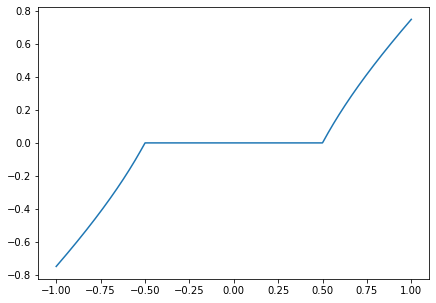

In [105]:
x = np.linspace(-1, 1, 1000)

plt.figure(figsize=(7,5))
plt.plot(x, WienerOP(x,.5))
plt.show()

And now we will prepare the parameters of the thresholding and the reconstruction operator before applying the algorithm.

In [107]:
lambdas=np.arange(0.1,1,0.1)

In [108]:
Jmax = np.log2(height)-1
Jmin = Jmax-3

The algorithm is programed here below. We will move the gradient descent (Proj$_{C}$) to the wavelet domain and return back to the real domain to get the image in each iteration. We will do 100 iterations. We will be ploting the best reconstruction in each case and record the best parameters used in the process

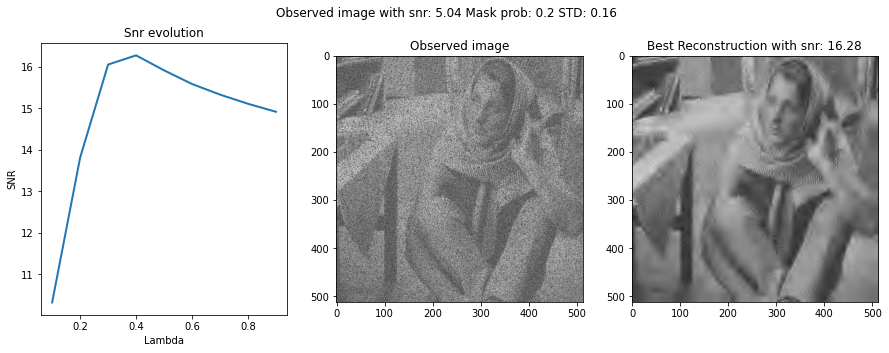

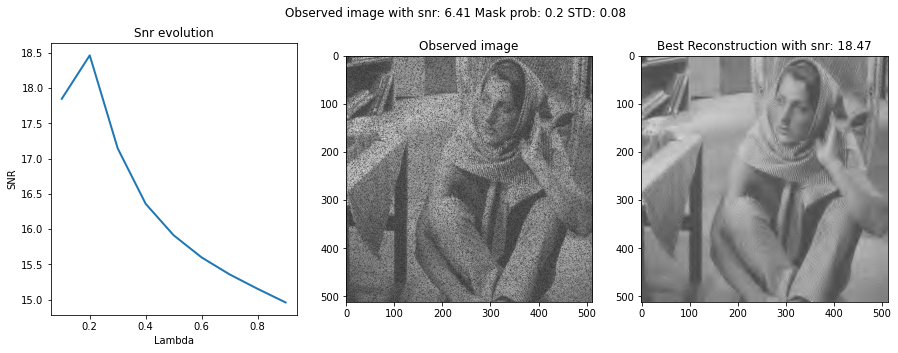

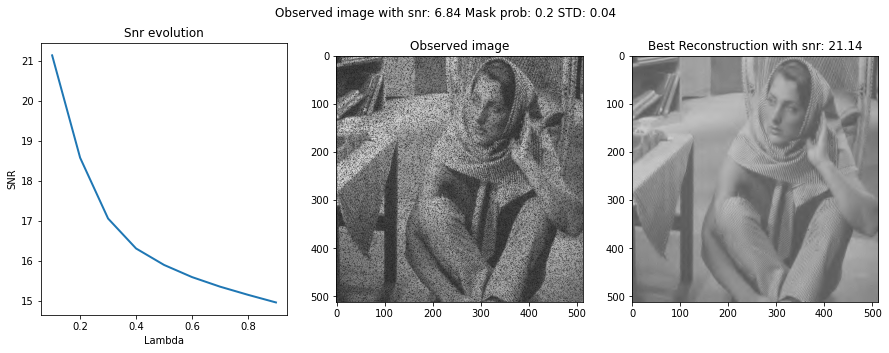

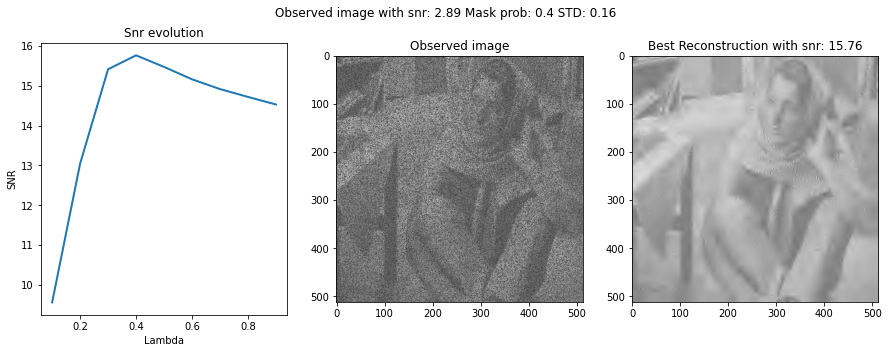

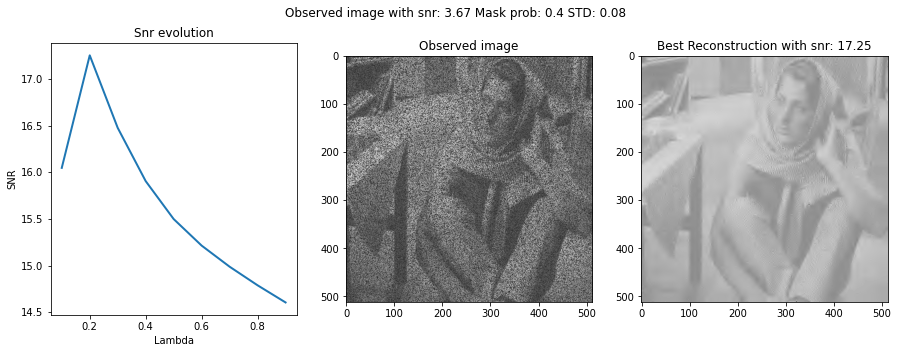

...

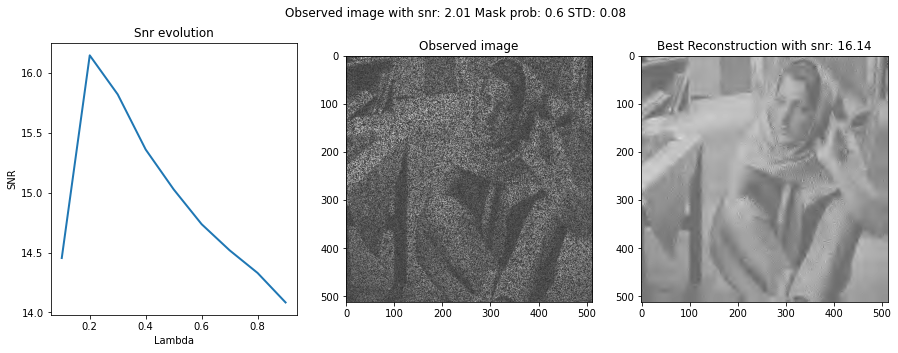

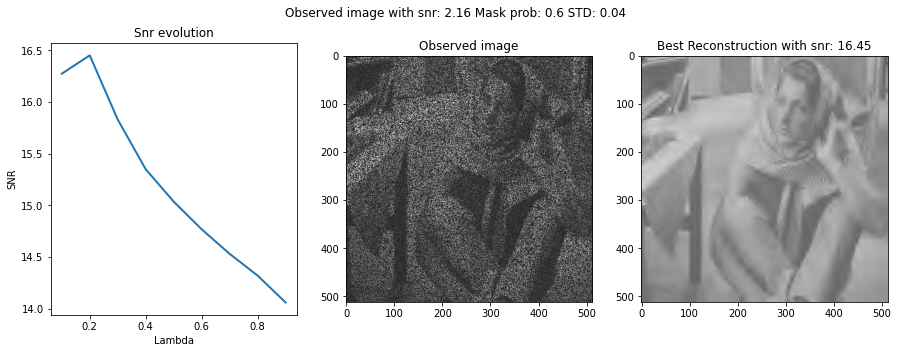

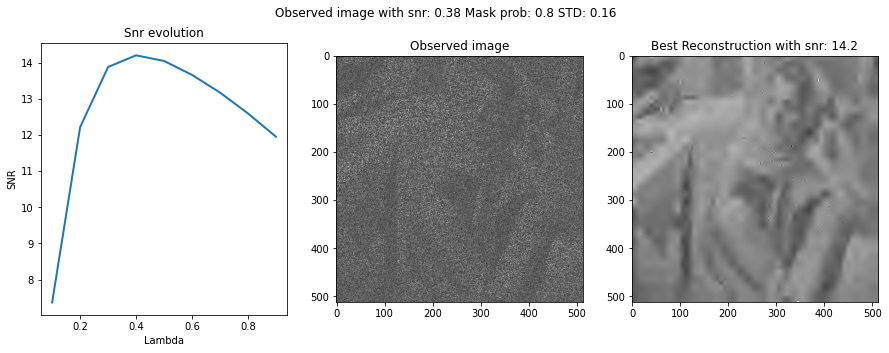

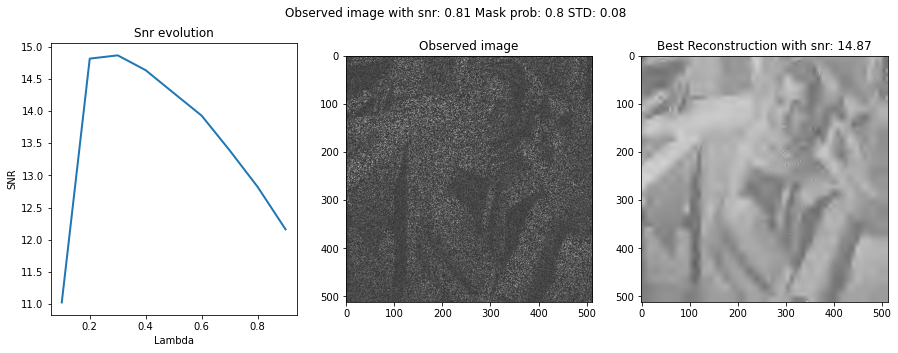

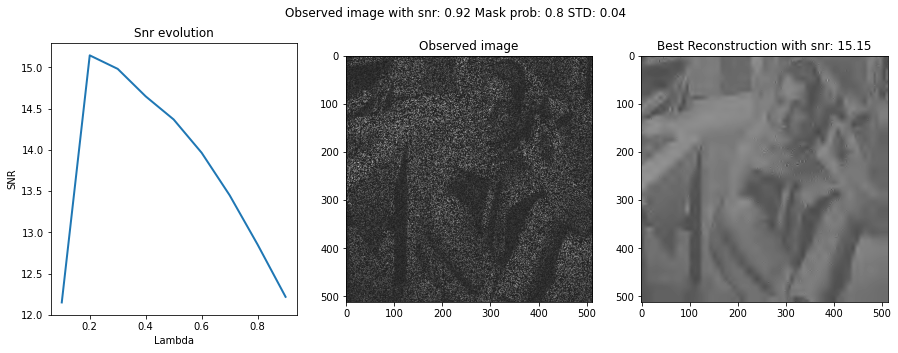

In [109]:
for i in range(len(observed_images)):
    y=observed_images[i][0] #Get observed image
    fSpars=observed_images[i][0] #First iteration, observed image
    prob=observed_images[i][1]
    standard_d = observed_images[i][2]
    omega=omegas[i] #The mask applied to that image
    
    lambda_list=[]
    snr_s=[]
    best_image = None
    best_snr = -np.inf
    
    for lambd in lambdas: #For each lambda
        lambda_list.append(lambd) #Store lambda
        niter = 100
        for j in range(niter): #Repeat n times
            fSpars = WienerOPPsi(ProjC(fSpars, omega, y), lambd,Jmin) #Ψ * Proj * Ψ
        
        snr_image=snr(gray,fSpars)
        if(snr_image>best_snr):
            best_snr=snr_image
            best_image=fSpars
        snr_s.append(snr_image)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle("Observed image with snr: " + str(round(snr(gray,y),2)) + " Mask prob: " + str(round(prob,2)) + " STD: " + str(round(standard_d,2)))
    
    ax1.set_title("Snr evolution")
    ax1.plot(lambda_list, snr_s, linewidth=2)
    ax1.set_xlabel("Lambda")
    ax1.set_ylabel("SNR")
    
    ax2.set_title("Observed image")
    ax2.imshow(y,cmap='gray')
    
    ax3.set_title("Best Reconstruction with snr: " + str(round(best_snr,2)))
    ax3.imshow(best_image,cmap='gray')
    
    fig.set_figheight(5)
    fig.set_figwidth(15)
    
    plt.show()
        

# Inpainting using Translation Invariant Wavelet Sparsity

Having [1] as the main reference for this exercise, orthogonal sparsity performs a poor regularization because of the lack of translation invariance. This regularization is enhanced by considering $Ψ$ as a redundant tight frame of translation invariant wavelets. We will move around this frame and use a scaling factor ($U$) iterative inside the wavelet domain and one thus looks for optimal coefficients $a^{⋆}$ that solves

\begin{equation}
a^{⋆} \in argmin_{a}E(a)=\cfrac{1}{2}∥y−ΦΨa∥^{2}+λJ(a)
\end{equation}

So at the end we can get the denoised version of the image in the real (image) domain.

Important: The operator $Ψ^{∗}$ is the forward translation invariant wavelet transform. It computes the inner product with the unit norm wavelet atoms:

\begin{equation}
(Ψ^{∗}f)_{m}=⟨f,\psi_{m}⟩\text{ with }∥ψ_{m}∥=1.
\end{equation}

The reconstruction operator $Ξ$ satisfies $ΞΨ^{∗}f=f$, and is the pseudo inverse of the analysis operator $Ξ=(Ψ_{∗})^{+}$.

For our algorithm, we will need to use $Ψ$ and not $Ξ$. And we have

\begin{equation}
Ξ=Ψdiag(U)f
\end{equation}

where $U_{m}$ account for the redundancy of the scale of the atom $ψ_{m}$. 

The forward-backward algorithm now compute a series of wavelet coefficients a(ℓ) computed as

\begin{equation}
a^{(ℓ+1)}=O_{τλ}(a^{(ℓ)}+Ψ^{∗}Φ(y−ΦΨa^{(ℓ)})).
\end{equation}

where $O$ is a threshold operation, dependent on the wavelet transform $Ψ$. $Φ$ is the masking operator. $τ$ and $λ$ are arbitraty parameters. Also, the step size should satisfy:

\begin{equation}
τ<\cfrac{2}{∥ΨΦ∥}≤2min(u).
\end{equation}

But we do not why the step has to follow this equation as last time.

Now what is left is to apply each threshold operation in each case and discuss the results. 

## Soft Thresholding

In [20]:
lambdas=np.arange(0.1,1,0.1)

In [21]:
Jmax = np.log2(height)-1
Jmin = Jmax-3

In [22]:
J = Jmax-Jmin + 1
u = np.hstack(([4**(-J)], 4**(-np.floor(np.arange(J + 2./3,1,-1./3)))))
U = np.transpose(np.tile(u, (height,width,1)),(2,0,1))

In [23]:
tau = 1.9*np.min(u)

The algorithm is here below, we will calculate the coefficientes in the wavelet domain and return back to the real domain to get the reconstructed image in each iteration. We will do 100 iterations. We will be ploting the best reconstruction in each case and record the best parameters used in the process.

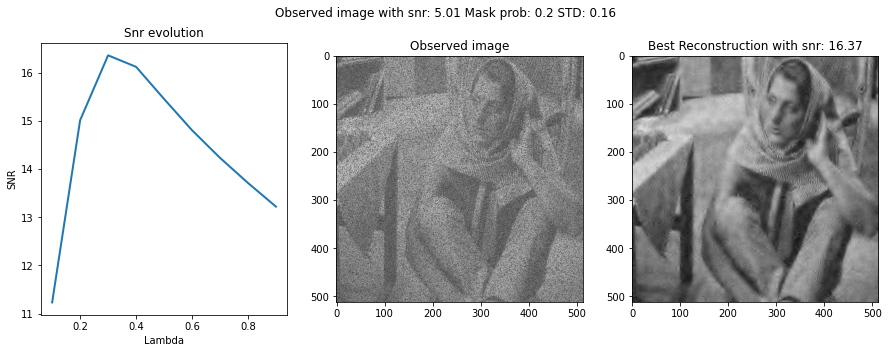

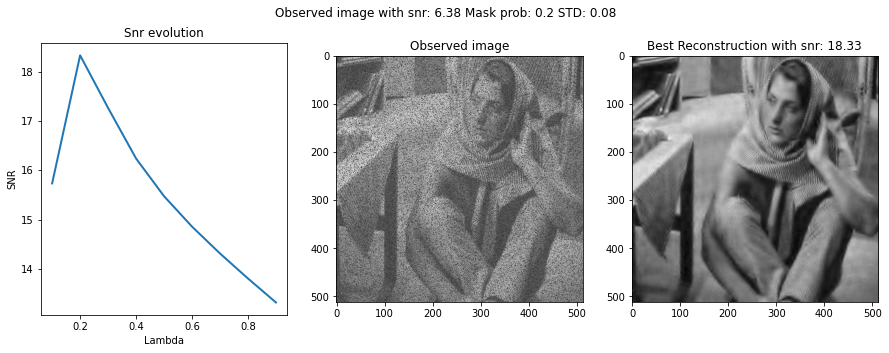

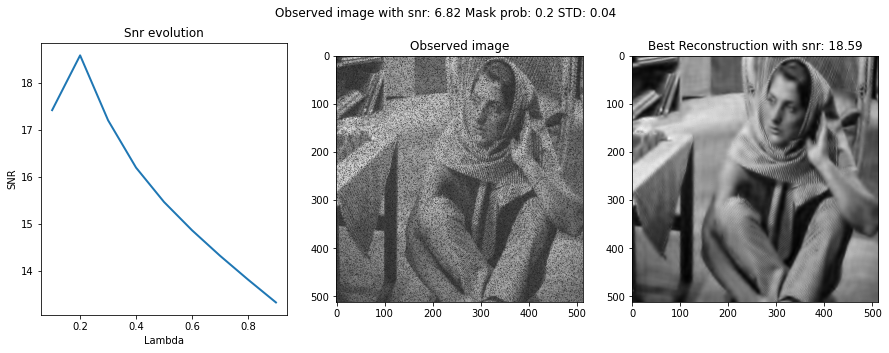

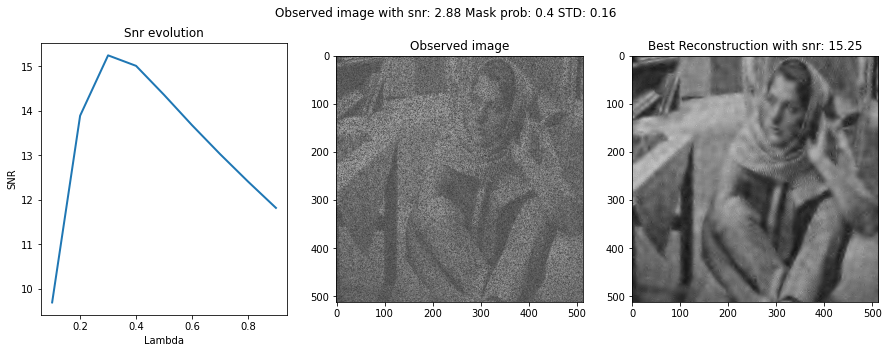

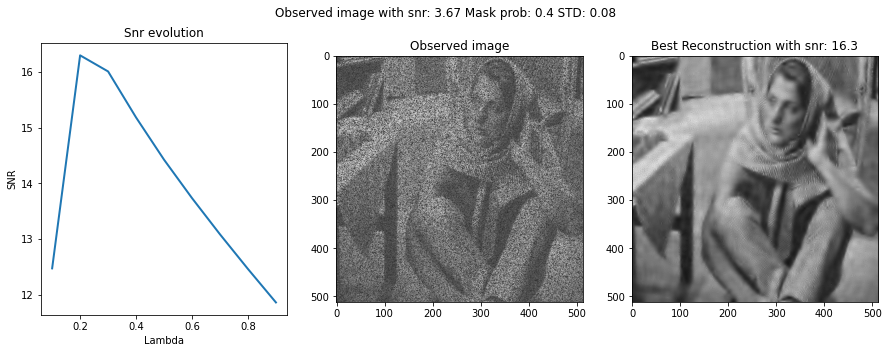

...

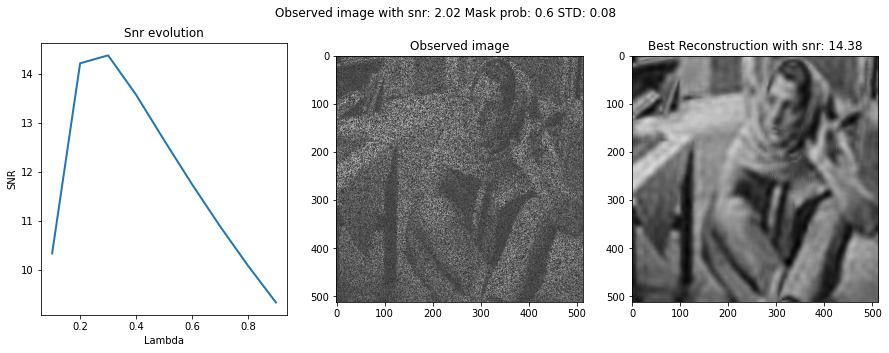

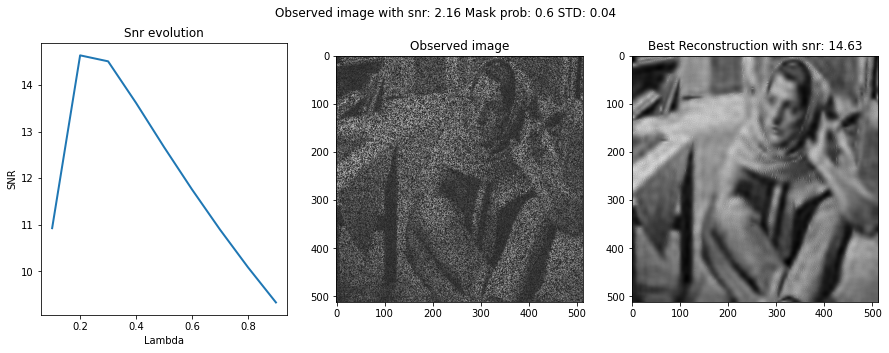

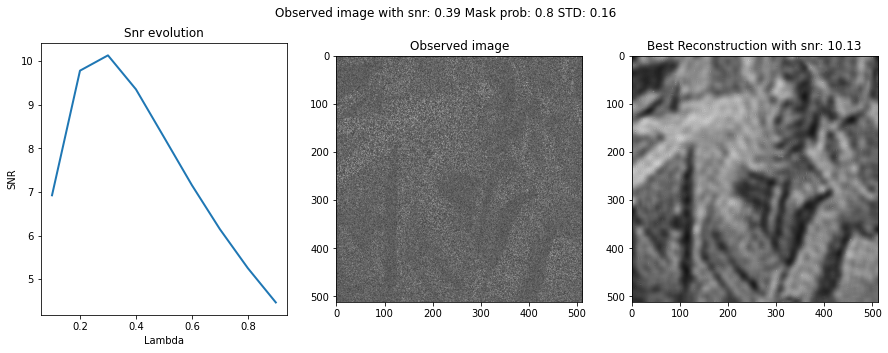

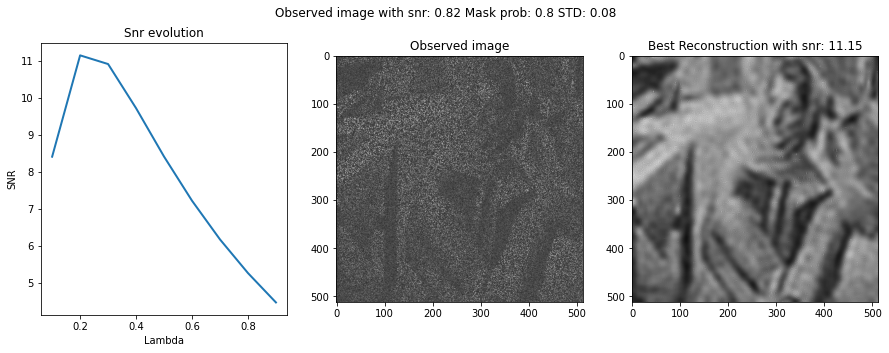

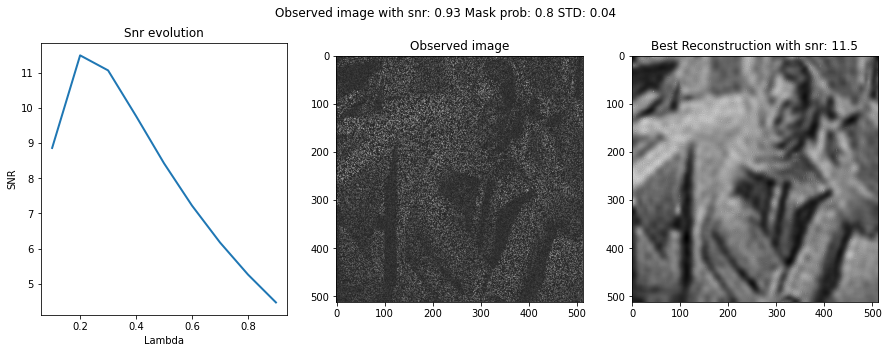

In [24]:
for i in range(len(observed_images)):
    y=observed_images[i][0] #Get observed image
    fSpars=observed_images[i][0] #First iteration, observed image
    prob=observed_images[i][1]
    standard_d = observed_images[i][2]
    omega=omegas[i] #The mask applied to that image
    
    lambda_list=[]
    snr_s=[]
    best_image = None
    best_snr = -np.inf
    
    for lambd in lambdas:
        a = U*PsiS_a(fSpars,Jmin) #We are getting the coefficients
        lambda_list.append(lambd) #Store lambda
        niter = 100
        for j in range(niter):
            fTI = Psi_a(a,U,Jmin) #Image
            d = y-Phi(fTI, omega)
            # step 
            a = SoftThresh(a + tau*PsiS_a(Phi(d, omega),Jmin), lambd*tau)
        
        fTI = Psi_a(a,U,Jmin) #Getting image
        snr_image=snr(gray,fTI)
        if(snr_image>best_snr):
            best_snr=snr_image
            best_image=fTI
        snr_s.append(snr_image)
        
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle("Observed image with snr: " + str(round(snr(gray,y),2)) + " Mask prob: " + str(round(prob,2)) + " STD: " + str(round(standard_d,2)))
    
    ax1.set_title("Snr evolution")
    ax1.plot(lambda_list, snr_s, linewidth=2)
    ax1.set_xlabel("Lambda")
    ax1.set_ylabel("SNR")
    
    ax2.set_title("Observed image")
    ax2.imshow(y,cmap='gray')
    
    ax3.set_title("Best Reconstruction with snr: " + str(round(best_snr,2)))
    ax3.imshow(best_image,cmap='gray')
    
    fig.set_figheight(5)
    fig.set_figwidth(15)
    
    plt.show()        

## Hard Thresholding

In [25]:
Jmax = np.log2(height)-1
Jmin = Jmax-3

In [26]:
J = Jmax-Jmin + 1
u = np.hstack(([4**(-J)], 4**(-np.floor(np.arange(J + 2./3,1,-1./3)))))
U = np.transpose(np.tile(u, (height,width,1)),(2,0,1))

In [27]:
tau = 1.9*np.min(u)

In [28]:
lambdas=np.arange(0.1,1,0.1)

The algorithm is here below, we will calculate the coefficientes in the wavelet domain and return back to the real domain to get the reconstructed image in each iteration. We will do 100 iterations. We will be ploting the best reconstruction in each case and record the best parameters used in the process.

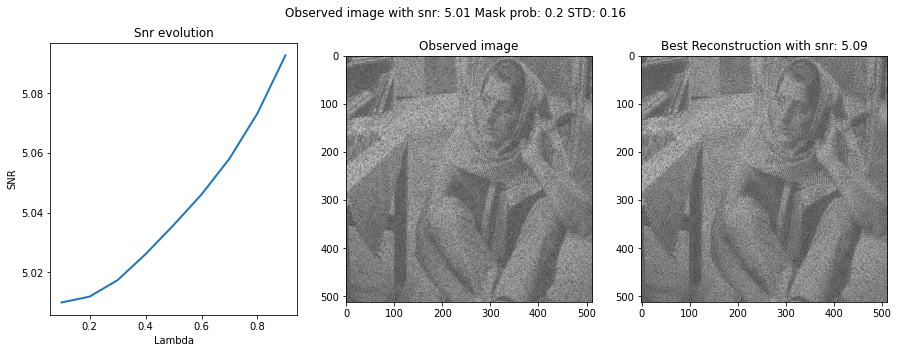

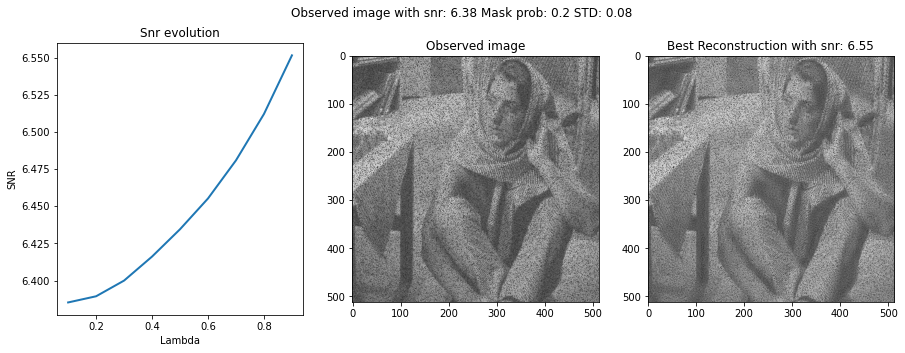

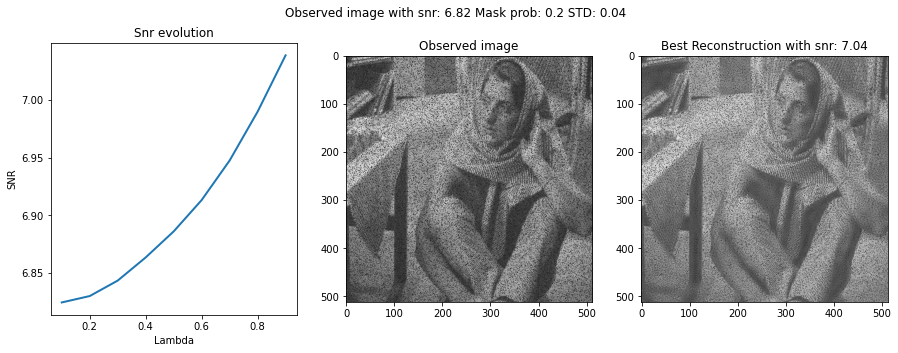

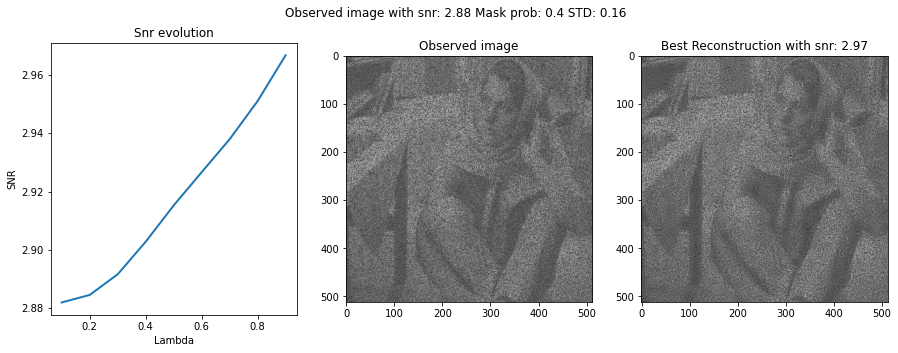

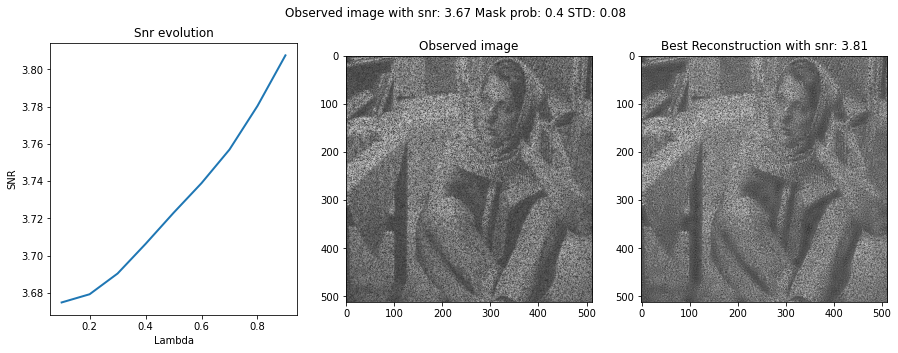

...

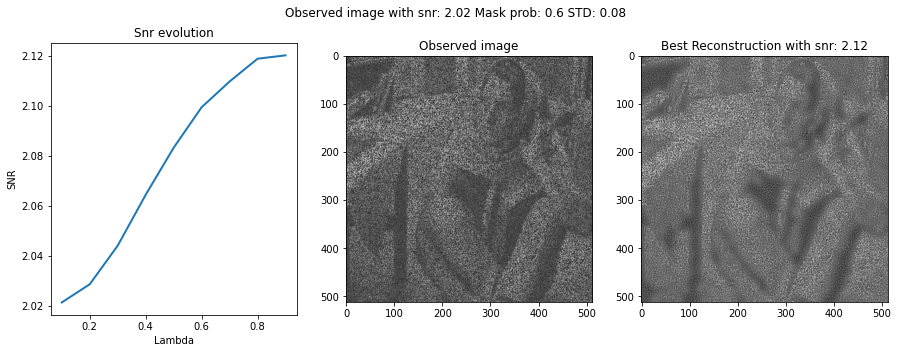

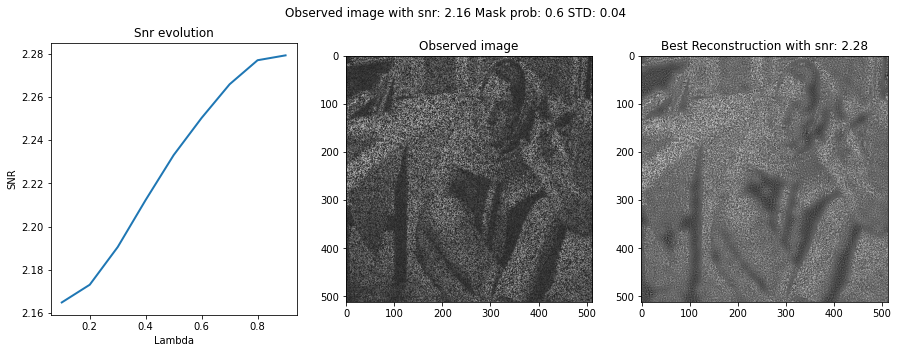

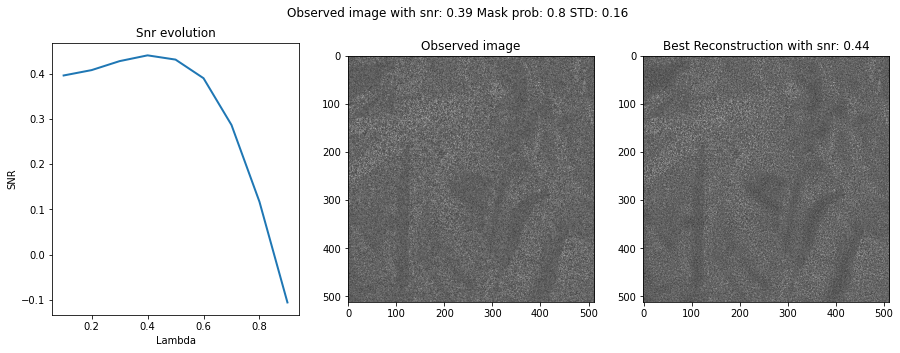

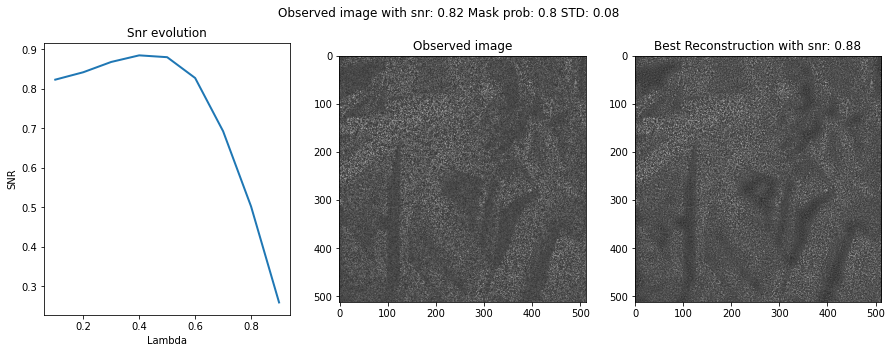

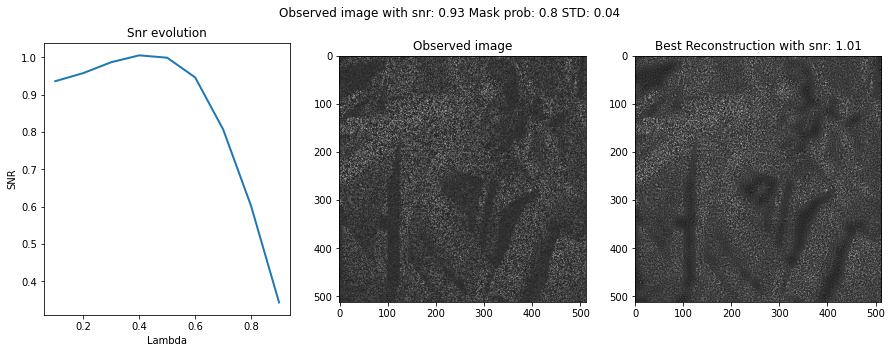

In [29]:
for i in range(len(observed_images)):
    y=observed_images[i][0] #Get observed image
    fSpars=observed_images[i][0] #First iteration, observed image
    prob=observed_images[i][1]
    standard_d = observed_images[i][2]
    omega=omegas[i] #The mask applied to that image
    
    lambda_list=[]
    snr_s=[]
    best_image = None
    best_snr = -np.inf
    
    for lambd in lambdas:
        a = U*PsiS_a(fSpars,Jmin) #We are getting the coefficients
        lambda_list.append(lambd) #Store lambda
        niter = 100
        for j in range(niter):
            fTI = Psi_a(a,U,Jmin) #Image
            d = y-Phi(fTI, omega)
            # step 
            a = HardThresh(a + tau*PsiS_a(Phi(d, omega),Jmin), lambd*tau)
        
        fTI = Psi_a(a,U,Jmin)
        snr_image=snr(gray,fTI)
        if(snr_image>best_snr):
            best_snr=snr_image
            best_image=fTI
        snr_s.append(snr_image)
        
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle("Observed image with snr: " + str(round(snr(gray,y),2)) + " Mask prob: " + str(round(prob,2)) + " STD: " + str(round(standard_d,2)))
    
    ax1.set_title("Snr evolution")
    ax1.plot(lambda_list, snr_s, linewidth=2)
    ax1.set_xlabel("Lambda")
    ax1.set_ylabel("SNR")
    
    ax2.set_title("Observed image")
    ax2.imshow(y,cmap='gray')
    
    ax3.set_title("Best Reconstruction with snr: " + str(round(best_snr,2)))
    ax3.imshow(best_image,cmap='gray')
    
    fig.set_figheight(5)
    fig.set_figwidth(15)
    
    plt.show() 

## Empirical Wiener

In [30]:
Jmax = np.log2(height)-1
Jmin = Jmax-3

In [31]:
J = Jmax-Jmin + 1
u = np.hstack(([4**(-J)], 4**(-np.floor(np.arange(J + 2./3,1,-1./3)))))
U = np.transpose(np.tile(u, (height,width,1)),(2,0,1))

In [32]:
tau = 1.9*np.min(u)

In [33]:
lambdas=np.arange(0.1,1,0.1)

The algorithm is here below, we will calculate the coefficientes in the wavelet domain and return back to the real domain to get the reconstructed image in each iteration. We will do 100 iterations. We will be ploting the best reconstruction in each case and record the best parameters used in the process.

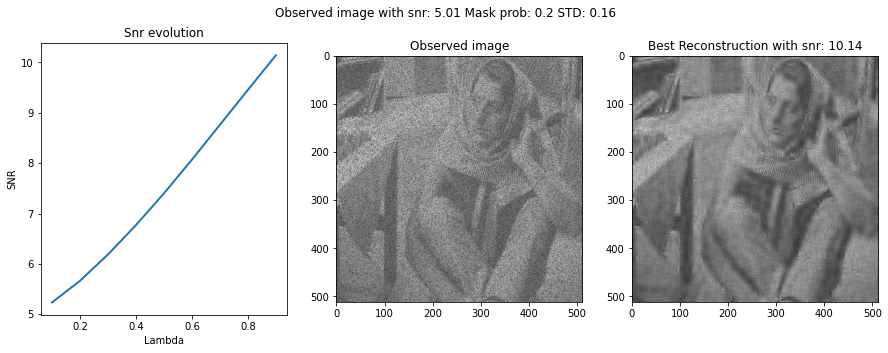

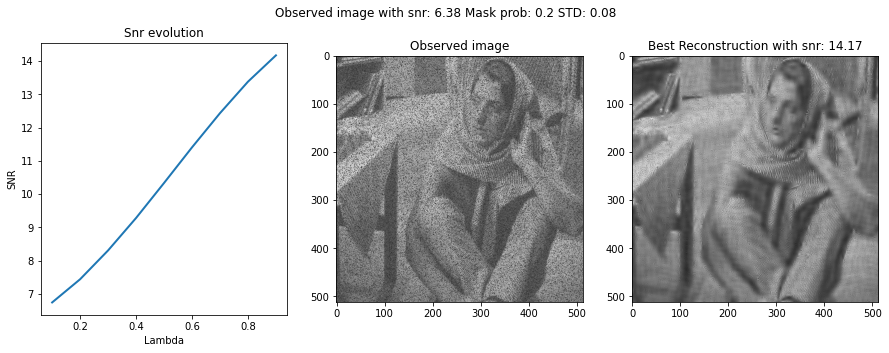

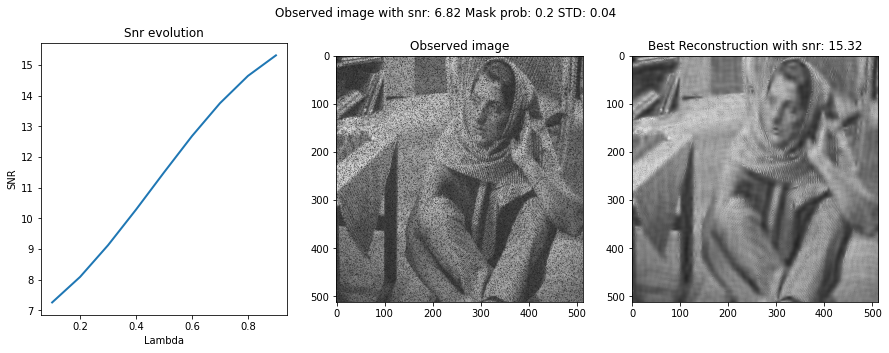

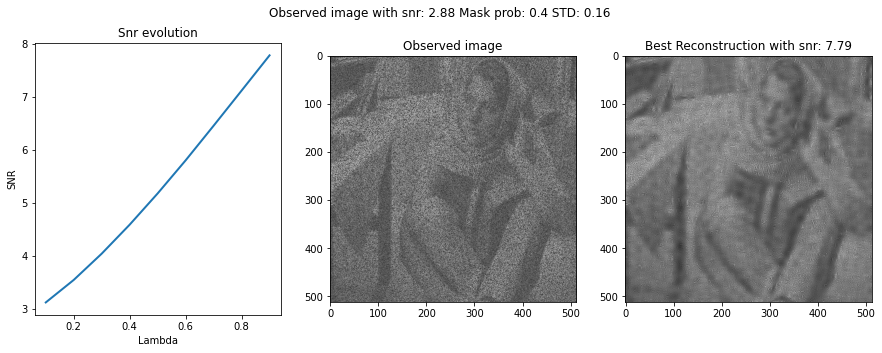

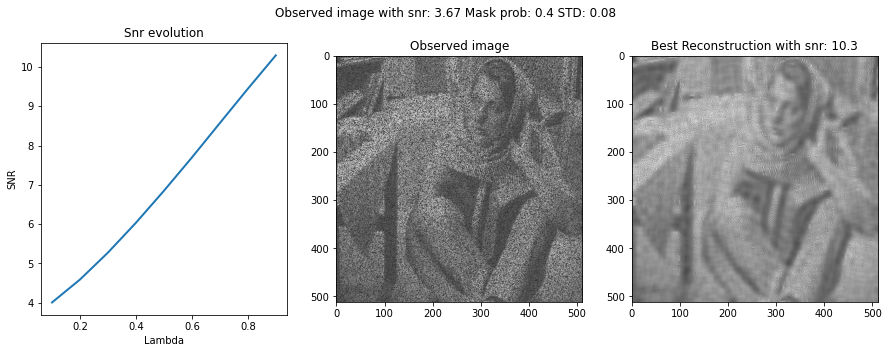

...

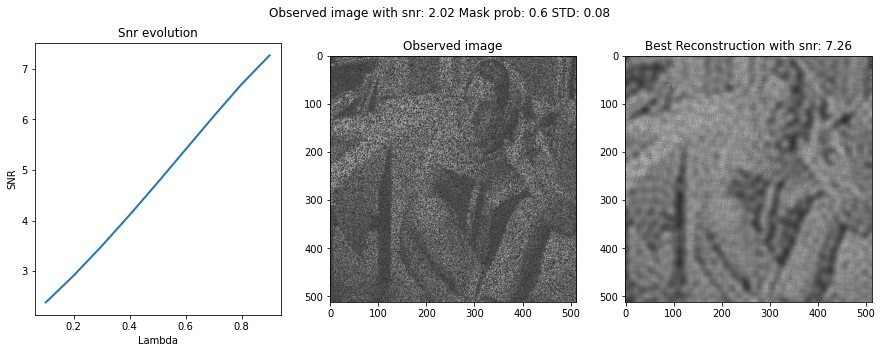

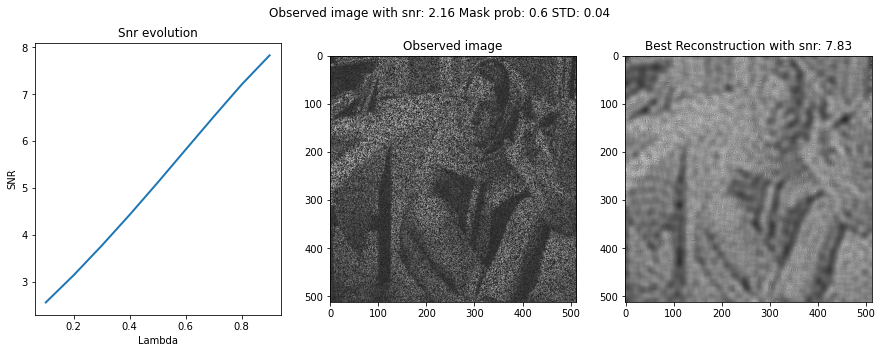

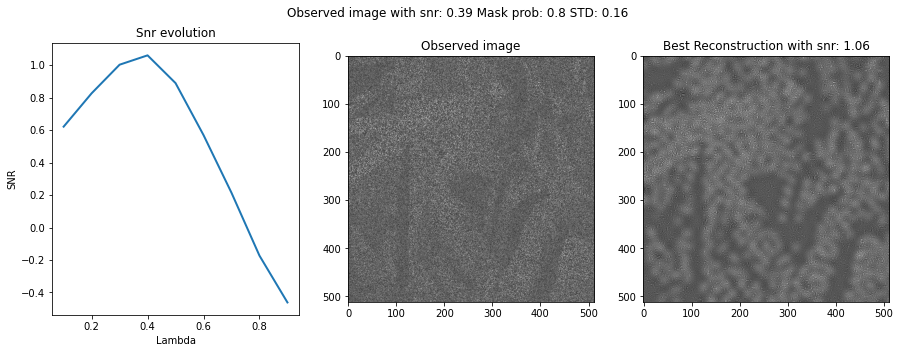

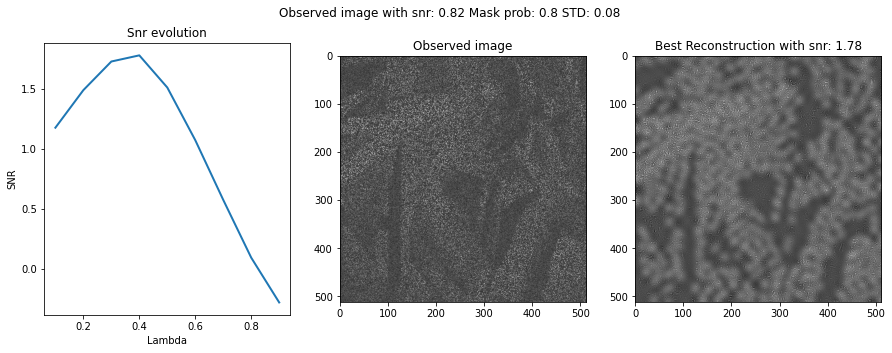

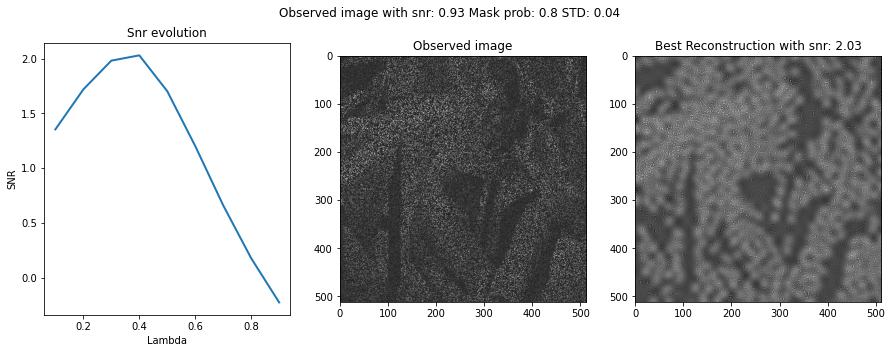

In [34]:
for i in range(len(observed_images)):
    y=observed_images[i][0] #Get observed image
    fSpars=observed_images[i][0] #First iteration, observed image
    prob=observed_images[i][1]
    standard_d = observed_images[i][2]
    omega=omegas[i] #The mask applied to that image
    
    lambda_list=[]
    snr_s=[]
    best_image = None
    best_snr = -np.inf
    
    for lambd in lambdas:
        a = U*PsiS_a(fSpars,Jmin) #We are getting the coefficients
        lambda_list.append(lambd) #Store lambda
        niter = 100
        for j in range(niter):
            fTI = Psi_a(a,U,Jmin) #Image
            d = y-Phi(fTI, omega)
            # step 
            a = WienerOP(a + tau*PsiS_a(Phi(d, omega),Jmin), lambd*tau)
        
        fTI = Psi_a(a,U,Jmin)
        snr_image=snr(gray,fTI)
        if(snr_image>best_snr):
            best_snr=snr_image
            best_image=fTI
        snr_s.append(snr_image)
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)
    fig.suptitle("Observed image with snr: " + str(round(snr(gray,y),2)) + " Mask prob: " + str(round(prob,2)) + " STD: " + str(round(standard_d,2)))
    
    ax1.set_title("Snr evolution")
    ax1.plot(lambda_list, snr_s, linewidth=2)
    ax1.set_xlabel("Lambda")
    ax1.set_ylabel("SNR")
    
    ax2.set_title("Observed image")
    ax2.imshow(y,cmap='gray')
    
    ax3.set_title("Best Reconstruction with snr: " + str(round(best_snr,2)))
    ax3.imshow(best_image,cmap='gray')
    
    fig.set_figheight(5)
    fig.set_figwidth(15)
    
    plt.show() 

# Conclusions
In this notebook, we have used two different solutions to solve the image inpainting problem. Starting with a set of noisy images, these techniques have allowed us to reconstruct them up to a certain point. 

Using Orthogonal Wavelet Sparsity makes the process of reconstruction much faster with decent results. In general, the best results are achived using a low threshold in all 3 types of thresholding (soft, hard and wiener) and, although the impact of the highest noises is not reduced completely, in general we can see a better snr compared to the observed image, proving that the method is working (the best results were achieved with low noise and using hard thresholding). Something interesting that we can observe in the reconstructions is the fact that some images are "whited" when they face a very noisy image. 

On the other hand, Invariant Wavelet Sparsity is a very expensive method (computationally speaking and using same number of iterations than Orthogonal Wavelet Sparsity) and there the noise effect was more difficult to remove in the 3 cases. It was almost reduced using soft Thresholding but the hard threshold delivered very poor results. There was no "whited" process of the images and the optimal thresholds varied much more than in Orthogonal Wavelet Sparsity.

To sum up, these methods have allowed us to see and try different methods to reconstruct signals. Although they are not perfect, we can see that what actually makes this process challeging is more the noise than the misinformation of the image.

# References
[1] https://nbviewer.ipython.org/github/gpeyre/numerical-tours/blob/master/python/inverse_5_inpainting_sparsity.ipynb